### System Installation

In [ ]:
!pip install -r https://raw.githubusercontent.com/ultralytics/yolov5/master/requirements.txt

     |████████████████████████████████| 636 kB 7.1 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
!python -m pip install pyyaml

In [ ]:
import os
import glob
import copy
import torch
import random
import cv2 as cv
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
!gdown https://drive.google.com/u/0/uc?id=1cdSf3NLweas03-_bQEafB3MlBrHpaBaL; mkdir Step1; mv best.pt Step1
!gdown https://drive.google.com/u/0/uc?id=1J7xz1oJx6hH1MDOxv6pHLUUmBNK2rkQT; mkdir Step2 Data; mv best.pt Step2; rm -r sample_data

Downloading...
From: https://drive.google.com/u/0/uc?id=1cdSf3NLweas03-_bQEafB3MlBrHpaBaL
To: /content/best.pt
14.8MB [00:00, 87.1MB/s]
mkdir: cannot create directory ‘Step1’: File exists
Downloading...
From: https://drive.google.com/u/0/uc?id=1J7xz1oJx6hH1MDOxv6pHLUUmBNK2rkQT
To: /content/best.pt
14.8MB [00:00, 130MB/s]
mkdir: cannot create directory ‘Step2’: File exists
mkdir: cannot create directory ‘Data’: File exists
rm: cannot remove 'sample_data': No such file or directory


### Pulling all Images

In [ ]:
from google.colab import drive
drive.mount('/content/ShardDrives/')
!cp /content/ShardDrives/MyDrive/Electricity-task/DataSet/Datasets/Set1/* /content/Data
!cp /content/ShardDrives/MyDrive/Electricity-task/DataSet/Datasets/Set2/* /content/Data

Mounted at /content/ShardDrives/


### Loading the two Models

In [ ]:
model1 = torch.hub.load('ultralytics/yolov5', 'custom', path='Step1/best.pt')
model2 = torch.hub.load('ultralytics/yolov5', 'custom', path='Step2/best.pt') 

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2021-8-24 torch 1.9.0+cu102 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
Model Summary: 232 layers, 7246518 parameters, 0 gradients
Adding AutoShape... 
Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2021-8-24 torch 1.9.0+cu102 CUDA:0 (Tesla P100-PCIE-16GB, 16280.875MB)

Fusing layers... 
Model Summary: 232 layers, 7254609 parameters, 0 gradients
Adding AutoShape... 


In [ ]:
%matplotlib inline
labelx = {0:'Damage', 1:'Good()', 2:'Loose', 3:'Damage'}
labelc = {0:[47, 49, 196], 1:[82, 204, 65], 2:[0, 126, 245], 3:[179, 37, 47], 4:[0,0,0]}

### Models Prediction

In [ ]:
def SinglePrediction(path):
  img = cv.imread(path,cv.COLOR_BGR2RGB)
  oY, oX = img.shape[0], img.shape[1]
  resized1 = cv.resize(img, (512,512), interpolation = cv.INTER_AREA)
  results1 = model1(resized1)
  x1labels, x1cord_thres = results1.xyxyn[0][:, -1].cpu().numpy(), results1.xyxyn[0][:, :-1].cpu().numpy()
  Vis1 = copy.deepcopy(img)
  for o in range(len(x1cord_thres)):
    x, y, w, h = int((x1cord_thres[o][0])*oX), int((x1cord_thres[o][1])*oY), int((x1cord_thres[o][2])*oX), int((x1cord_thres[o][3])*oY)
    cv.rectangle(Vis1, (x, y), (w, h), (labelc[4]), 1)
    cv.putText(Vis1, 'DETECTED', (x, y-5), cv.FONT_HERSHEY_SIMPLEX, 0.6, (labelc[4]),1)
    roi = img[y:h, x:w]
    resized2 = cv.resize(roi, (608,608), interpolation = cv.INTER_AREA)
    results2 = model2(resized2)
    x2labels, x2cord_thres = results2.xyxyn[0][:, -1].cpu().numpy(), results2.xyxyn[0][:, :-1].cpu().numpy()
    for u in range(len(x2cord_thres)):
      x, y, w, h, t = int(((x2cord_thres[u][0])*608)), int(((x2cord_thres[u][1])*608)), int(((x2cord_thres[u][2])*608)), int(((x2cord_thres[u][3])*608)), int(x2labels[u])
      cv.rectangle(resized2, (int((x)), int((y))), (int((w)), int((h))), (labelc[t]), 2)
      cv.putText(resized2, str(labelx[t]), (x, y-5), cv.FONT_HERSHEY_SIMPLEX, 0.6, (labelc[t]), 2)
  resized3 = cv.resize(Vis1, (608,608), interpolation = cv.INTER_AREA)
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(17, 12))
  ax1.imshow(resized3); ax1.axis('off')
  ax2.imshow(resized2); ax2.axis('off')
  plt.show()
  return resized3, resized2

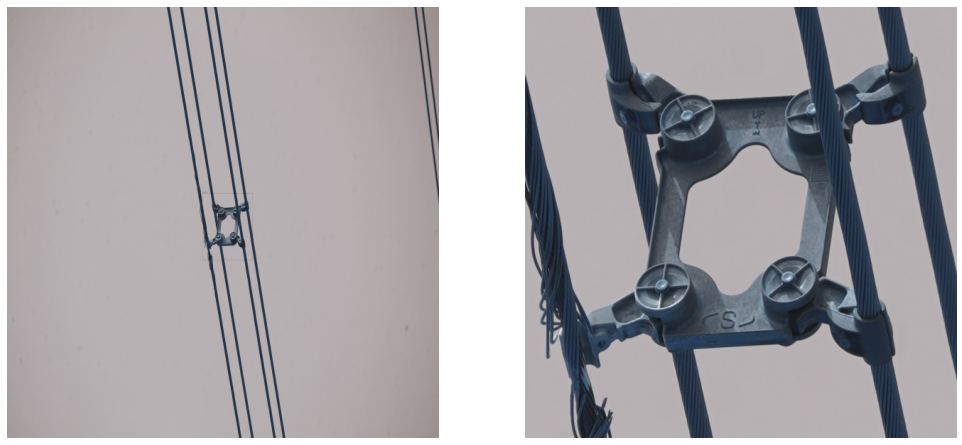

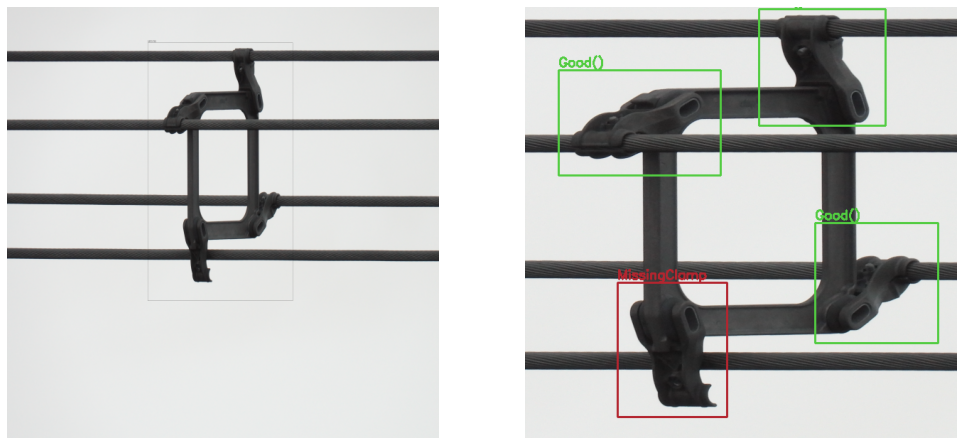

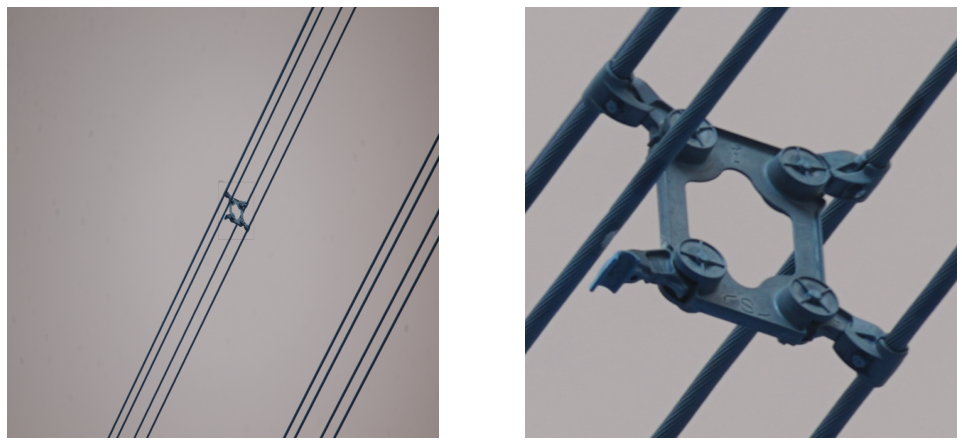

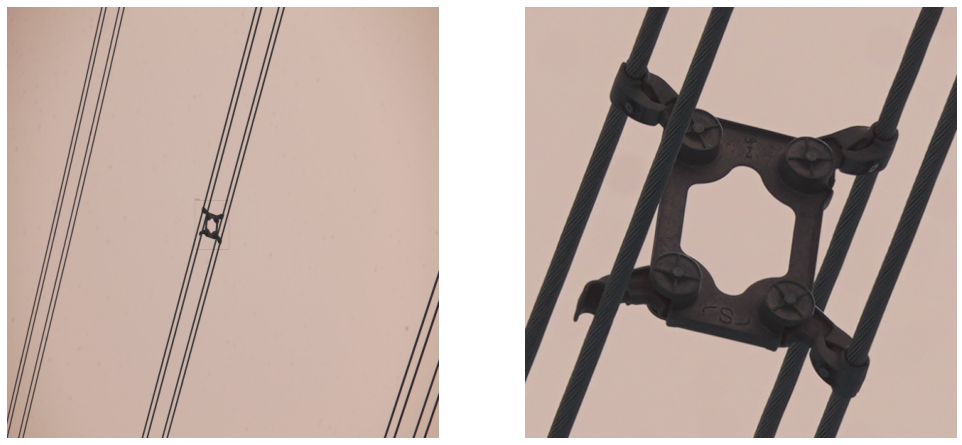

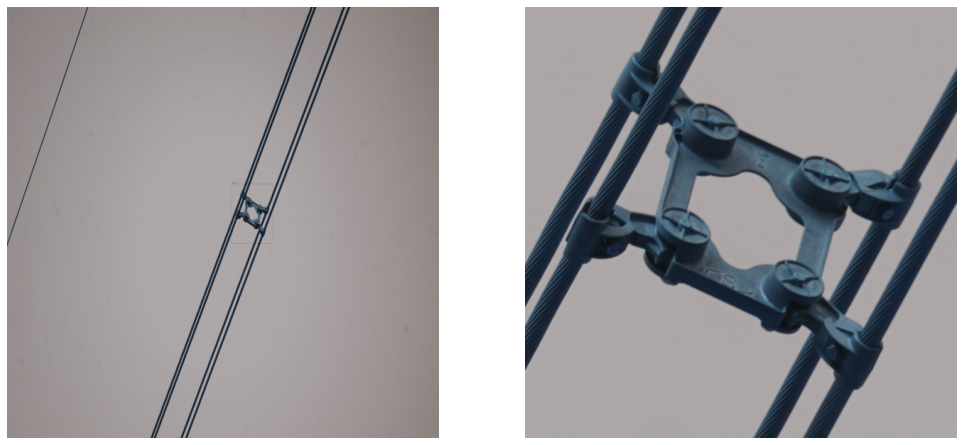

...

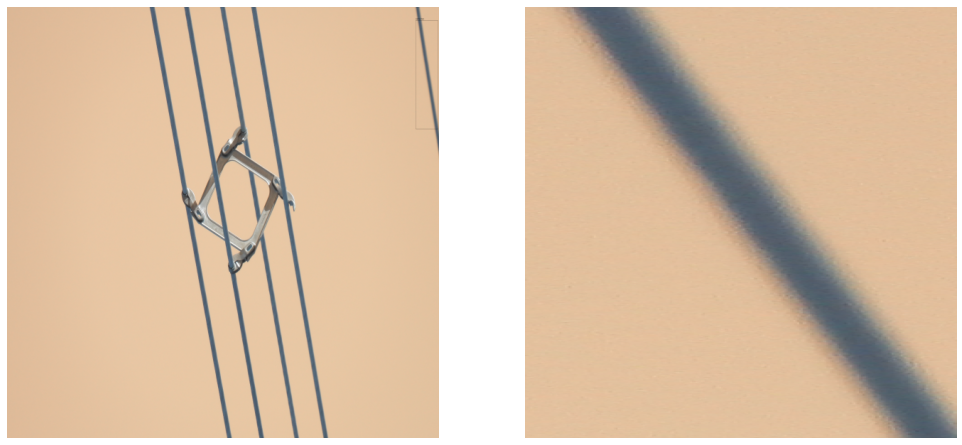

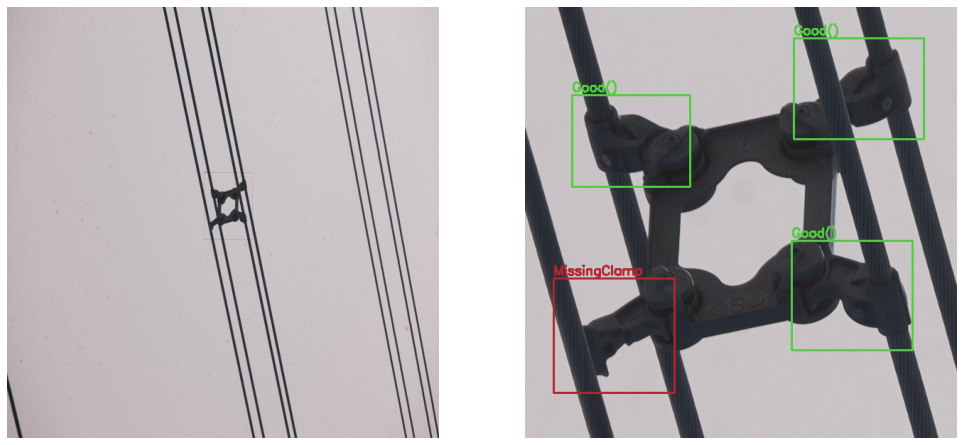

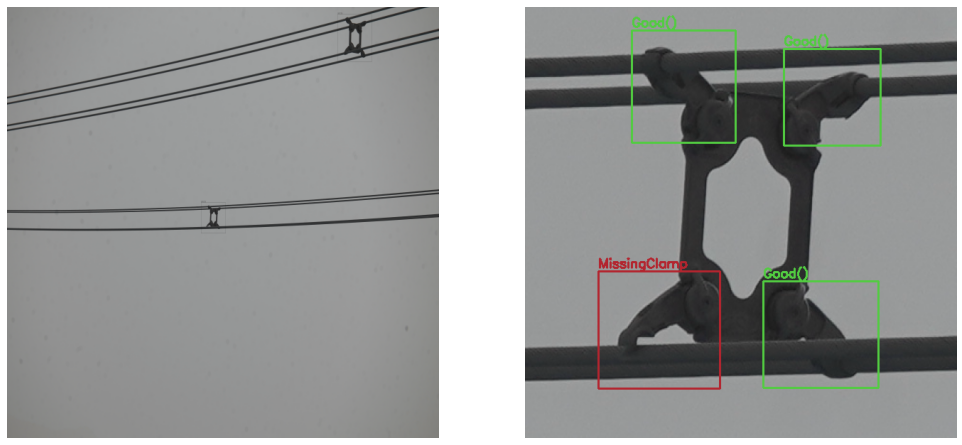

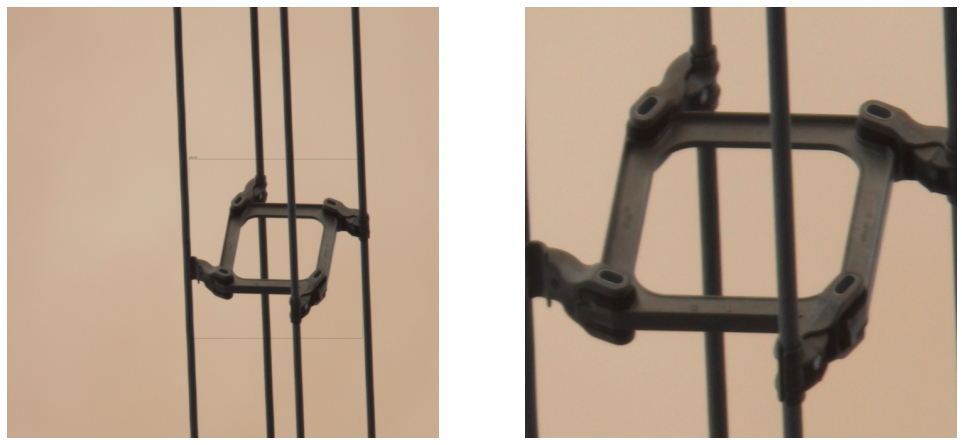

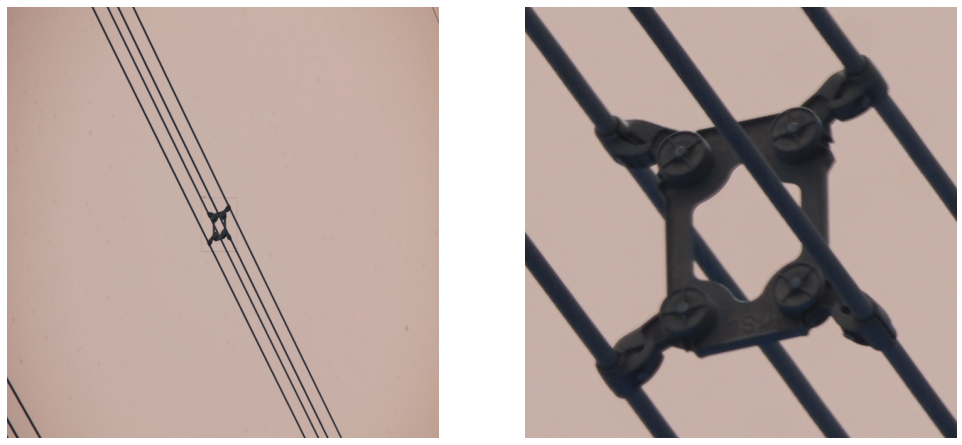

UnboundLocalError: ignored

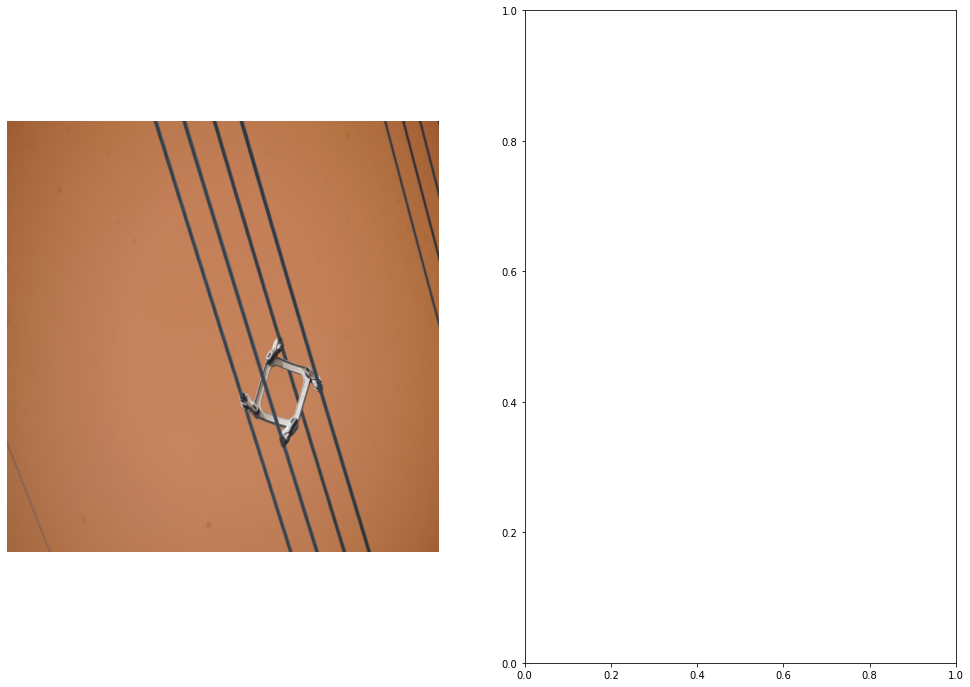

In [ ]:
for imageName in glob.glob('/content/Data/*'): #assuming JPG
    Imx1, Imx2 = SinglePrediction(imageName)
    print("\n")